# Notes about simulation:

**Running info**
- 2250 simulations
- week queue

**EA params**
- 160 generations
- 250 individuals
- 0.1 mutation rate
- 0.5 crossover rate

**Parameter search space**
- beta_0,    k1, k3, k5, k7,    k2, k4, k6, k8,    kn, kc,    K_1, K_3, K_5, K_7,    K_2, K_4, K_6, K_8
- minimums = [ -4,   -2, -2, -2, -2,   -2, -2, -2, -2,   -2, -2,     -2, -2, -2, -2,    -2, -2, -2, -2]
- maximums = [4.5,    4,  4,  4,  4,    4,  4,  4,  4,    4,  4,     4,   4,  4,  4,     4,  4,  4,  4]

**Mean of Mean Square Error of the top 2.5% of Individuals** 
- 1404.57196018


# Import packages and set settings

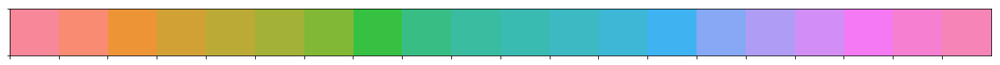

In [29]:
%matplotlib inline
import pathlib
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import numpy as np
import math
import pandas as pd
from scipy.integrate import odeint
import os

# plt.style.use("seaborn-whitegrid")
plt.rcParams['figure.figsize'] = [10.0, 8.0]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['grid.linestyle'] = '-'
plt.rcParams['legend.fontsize'] = 14
colors = [i['color'] for i in plt.rcParams['axes.prop_cycle']]

sns.palplot(sns.husl_palette(20, l=.7))
palette_husl = sns.husl_palette(20, l=.7)
# palette_husl.as_hex()

# Load data to fit to

In [30]:
wt_folder = '../data/MAPK activation/WT'
t100a_folder = '../data/MAPK activation/T100A'

def load_csv_data(folder):
    data = []
    for csv in pathlib.Path(folder).glob('*.csv'):
        f_data = pd.read_csv(csv)
        time = f_data['Time'].tolist()
        f_data=f_data.set_index('Time')
        f_data = f_data.mean(axis=1)
        f_data = f_data.tolist()
        data.append(f_data)
    return time, data

mapk_time, mapk_wt_data = load_csv_data(wt_folder)
mapk_time, mapk_t100a_data = load_csv_data(t100a_folder)

scorefxn_data = [mapk_wt_data, mapk_t100a_data]

# Supporting Functions

In [31]:
# def scorefxn1(scorefxn_time, scorefxn_data, inits, params_constants,
#               learned_params, time, plot_bool):
#     mse_total = 0
#     arr_params_IP = convert_individual(learned_params, arr_conversion_matrix)

#     for sig, MAPK_wt_data, MAPK_t100a_data in zip(params_constants[-1], scorefxn_data[0], scorefxn_data[1]):
#         params_constants = params_constants[:-1]+[sig]

#         # WT simulation
#         data = simulate_wt_experiment(inits, params_constants, arr_params_IP, time)
#         active = (data[:,2] + data[:,3])/params_constants[2]*100
#         # get index of time points closest
#         idx_closest_time_points = []
#         for each_time in scorefxn_time:
#             closest_idx = min(range(len(time)),
#                               key = lambda i: abs(time[i] - each_time))
#             idx_closest_time_points.append(closest_idx)
#         # use indexes of time points to get data points to score against
#         _scorefxn_data_active = active[[idx_closest_time_points]]
#         error_active = ((MAPK_wt_data - _scorefxn_data_active)**2).mean()
#         mse_total += error_active

#         # T100A simulation
#         data = simulate_t100a_experiment(inits, params_constants, arr_params_IP, time)
#         active = (data[:,2] + data[:,3])/params_constants[2]*100
#         idx_closest_time_points = []
#         for each_time in scorefxn_time:
#             closest_idx = min(range(len(time)),
#                               key = lambda i: abs(time[i] - each_time))
#             idx_closest_time_points.append(closest_idx)
#         _scorefxn_data_active = active[[idx_closest_time_points]]
#         error_active = ((MAPK_t100a_data - _scorefxn_data_active)**2).mean()
#         mse_total += error_active
#     return mse_total


# def scorefxn_helper(individual):
#     # just a helper function that pulls all of scorefxn1 dependencies together
#     # note the (), <--using single optimization in DEAP for now
#     # scorefxn1 is taking care of the multiple optimizations for now
#     return scorefxn1(mapk_time, scorefxn_data, inits, params_constants, individual, time, False),

def molarity_conversion(molecules):
    Na = 6.02214076*10**23
    cell_volume = 44                                  # volume of a yeast cell
    return molecules/(Na*cell_volume*10**-15)*1000000 # returns uM

# One step delay - a3

## Functions

In [37]:
def b0_a3_1D(initals,t,params_constants,params):
    MAP3K, MAP2K, MAPK, X = initals
    MAP3K_t, MAP2K_t, MAPK_t, X_t, s = params_constants 
    beta_0, alpha_3,    k1, k3, k5, k7,    k2, k4, k6, k8,    K_1, K_3, K_5, K_7,    K_2, K_4, K_6, K_8 = params
    
    MAP3K_I = MAP3K_t-MAP3K
    MAP2K_I = MAP2K_t-MAP2K
    MAPK_I = MAPK_t-MAPK
    X_I = X_t-X
    
    dMAP3K = ((s)/(1+X/beta_0)) * ((k1+alpha_3*MAPK)*MAP3K_I / (K_1 + MAP3K_I)) - (k2*MAP3K / (K_2+MAP3K))
    dMAP2K = (((k3*MAP3K)*MAP2K_I) / (K_3 + MAP2K_I)) - (k4*MAP2K / (K_4+MAP2K))
    dMAPK = (((k5*MAP2K)*MAPK_I) / (K_5 + MAPK_I)) - (k6*MAPK / (K_6+MAPK))
    dX = ((k7*MAPK*X_I) / (K_7 + X_I)) - (k8*X / (K_8+X))
    
    return dMAP3K, dMAP2K, dMAPK, dX

def simulate_wt_experiment_a3_1D(inits, params_constants, learned_params, time):
    # parameters to be learned - inits
    # parameters to be kept constant - params_constants
    # parameters to be learned - learned_params

    #solve odes:
    odes = odeint(b0_a3_1D, inits, time, args=(params_constants, learned_params))

    return odes

def simulate_t100a_experiment_a3_1D(inits, params_constants, learned_params, time):
    # parameters to be learned - inits
    # parameters to be kept constant - params_constants
    # parameters to be learned - learned_params
    beta_0, alpha_3, k1, k3, k5, k7, k2, k4, k6, k8, K_1, K_3, K_5, K_7, K_2, K_4, K_6, K_8 = learned_params
    learned_params = beta_0, 0, k1, k3, k5, 0, k2, k4, k6, k8, K_1, K_3, K_5, K_7, K_2, K_4, K_6, K_8

    #solve odes:
    odes = odeint(b0_a3_1D, inits, time, args=(params_constants, learned_params))

    return odes

## Inputs

In [ ]:
folder = 'C:/Users/sksuzuki/Desktop/killdevil/from/180905_b0_a3_1D_k7'

gen = 160
runs = 2000

MAP3K = 0
MAP2K = 0
MAPK = 0
X = 0

MAP3K_t=100
MAP2K_t=100
MAPK_t=100
X_t=100

s = [0, 150, 250, 350, 450, 550]


labelnames = ['B0', 'A3',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'K7',
              'K1', 'K3', 'K5', 'k8',
              'K2', 'K4', 'K6', 'K8'
                ]

mins = [ -4,  -4,   -4, -4, -4, -4,    -4, -4, -4, -4,     -4, -4, -4, -4,    -4, -4, -4, -4]

maxs = [4.5, 4.5,   4,  4,  4,  4,     4,  4,  4,  4,      4,  4,  4,  4,     4,  4,  4,  4]

diff = np.asarray(maxs)-np.asarray(mins)

# fb = 1
# t100a_fb = 0

initals = [MAP3K, MAP2K, MAPK, X]
params_constants = [MAP3K_t, MAP2K_t, MAPK_t, X_t, s] 
    
dt = 0.1
steps = 600
time = np.linspace(0,dt*steps,steps)

## Gather simulated data

In [ ]:
mse = []
params_from_file = []

empty_data = 0
for loaded_data in pathlib.Path(folder).glob('*.pickled'):
    if os.path.getsize(loaded_data) > 0:
        with open(loaded_data, 'rb') as f:
            new_data = pickle.load(f)
            mse.append(np.asarray(new_data[0]))
            params_from_file.append(np.asarray(new_data[1]))
    else:
        empty_data += 1

top = round((runs-empty_data)*0.05)
plt_top = round((runs-empty_data)*0.01)   
print('Plotting top ' +str(plt_top)+' runs')
    
new_params = []
last_mses = []
for i in range(len(params_from_file)):
    new_params.append(params_from_file[i][gen])
    last_mses.append(mse[i][gen])
last_mses = np.asarray(last_mses)
new_params = np.asarray(new_params)
new_params = new_params.T

idx_top = last_mses.argsort()[:top]

top_params = [([new_params[i][x] for i in range(len(new_params))]) for x in idx_top]
# top_params = []
# for idx in idx_top:
#     top_params.append(params_from_file[idx][100])

print('Best MSE: ' + str(np.min([mse[idx][gen] for idx in idx_top])))

In [ ]:
df_top_params = pd.DataFrame(top_params)
df_top_params.columns = labelnames
df_top_params_log = df_top_params.apply(np.log10)
df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

## Plot

In [ ]:
#initialize figure:
plt.clf()
fig, (ax1,ax2,ax3) = plt.subplots(3, 1, figsize=(12,30))


#plot 1
title_text = 'Gen ' + str(gen) + ' fit to WT'
ax1.set_title(title_text, fontsize=20)
ax1.set_xlabel('Time', fontsize=20)
# ax1.set_ylabel('gene expression', fontsize=20)
# ax1.set_xlim([0,150])1
# ax1.set_ylim([0,15])
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
color_palette = sns.color_palette("rocket", 6)[::-1]

# plot real data:
for idx, wt_data in enumerate(mapk_wt_data):
    ax1.plot(mapk_time, wt_data, 'o', markersize=10, color=color_palette[idx])
#     ax1.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])

# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax1.plot(time, active, color=color_palette[idx])
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax1.set_xlim(0,60)
print('# of unstable WT experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax1.legend(bbox_to_anchor=[1, 0.5], loc='center left')

#plot 2
title_text = 'Gen ' + str(gen) +  ' fit to T100A + inhib'
ax2.set_title(title_text, fontsize=20)
ax2.set_xlabel('Time', fontsize=20)

for idx, t100a_data in enumerate(mapk_t100a_data):
    ax2.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_t100a_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax2.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax2.set_xlim(0,60)
print('# of unstable T100A experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax2.legend(bbox_to_anchor=[1, 0.5], loc='center left')
#plot2    
ax3.set_xlabel('Generation', fontsize=20)
# ax2.set_ylabel('Sum of MSE', fontsize=20)
# ax3.set_yscale('log')
# ax2.set_xlim([0,gen])
# ax2.set_ylim([10**3,10**5])
for idx in idx_top:
    ax3.semilogy([x for x in range(gen)], mse[idx][:gen])
    

plt.show()

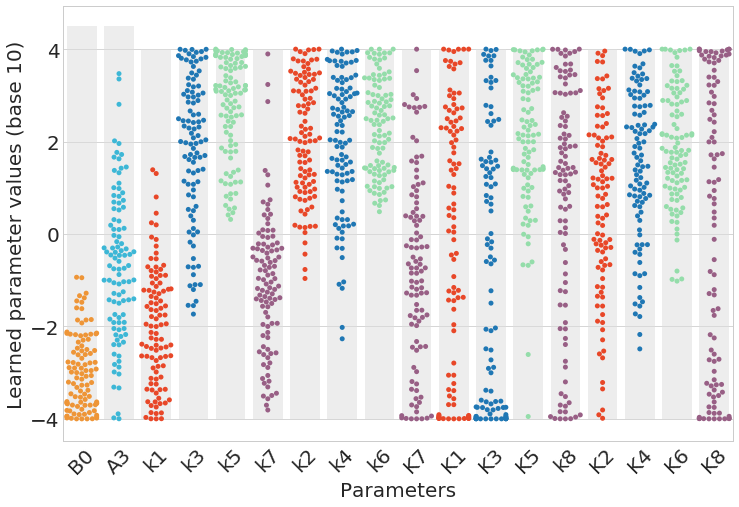

In [9]:
plt.rcParams['figure.figsize'] = [12.0, 8.0]

# positive 3db7d6
# negative ee9537
# hog1 ? 38bf85 or 94ddaa

colors = ['#ee9537', '#3db7d6',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728', '#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85']

pal = sns.set_palette(colors)

with sns.axes_style("whitegrid"):
    plt.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
    x = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M)
    x.set_xticklabels(labelnames,rotation=45)
#     ax.set_yscale("log")
#     ax.set_ylim(0.00001,100000)
#     ax4.set_xticks(locs)
#     plt.xticklabels(labelnames, fontsize=18, rotation=90)
    plt.xlabel('Parameters', fontsize=20)
    plt.ylabel('Learned parameter values (base 10)', fontsize=20)
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

(array([  34.,  111.,  123.,  638.,  544.,  152.,   45.,   76.,   26.,
          30.,   45.,   85.,   83.,    6.,    1.]),
 array([   874.39837145,   1602.50807903,   2330.61778661,   3058.72749419,
          3786.83720177,   4514.94690935,   5243.05661693,   5971.16632451,
          6699.27603209,   7427.38573967,   8155.49544725,   8883.60515483,
          9611.71486241,  10339.82456999,  11067.93427757,  11796.04398515]),
 <a list of 15 Patch objects>)

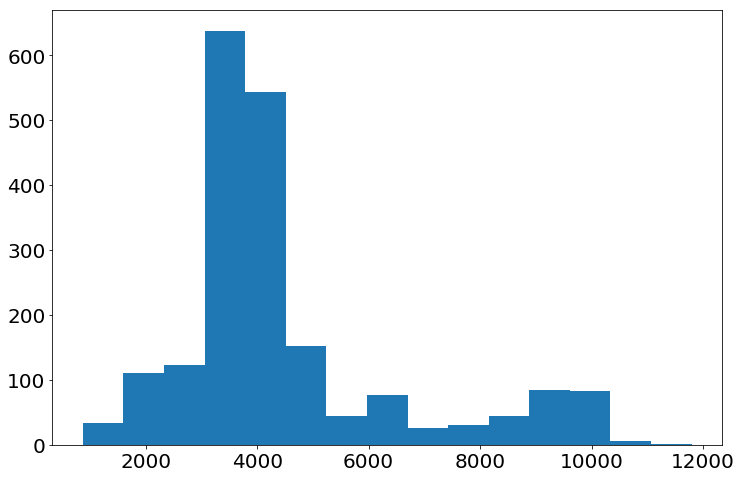

In [11]:
plt.hist(last_mses,bins=15,color='#1f77b4')

In [ ]:
color_palette = sns.color_palette("rocket", 6)[::-1]

for i, params in enumerate(top_params):
#     beta_1, beta_2, alpha, k1, k2, k3, k4, k5, k6, k7, k8, K_1, K_2, K_3, K_4, K_5, K_6, K_7, K_8, kn, kc = params
#     params = beta_1, beta_2, 0, k1, k2, k3, k4, k5, k6, k7, k8, K_1, K_2, K_3, K_4, K_5, K_6, K_7, K_8, 0, kc
    #plot real data:
#     for idx, (wt_data,t100a_data) in enumerate(zip(mapk_wt_data, mapk_t100a_data)):
#         plt.plot(mapk_time, wt_data, 'o', markersize=10, color=color_palette[idx])
#         plt.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])
    for idx, signal in enumerate(s):
        data = odeint(b0_a3_1D, initals, time, args=(params_constants[:-1]+[signal], params))
        active = data[:,2]
        plt.plot(time, active, label=str(signal)+' WT active', color=color_palette[idx])
#         plt.plot(time, data[:,4], dashes=[2, 2], label=str(signal)+' X')
        data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[signal], params, time)
        active = data[:,2]
        plt.plot(time, active, label=str(signal)+' T100A active', dashes= [4,2], color=color_palette[idx])
#         plt.plot(time, data[:,3], label=str(signal)+' MAPKn')
    plt.title(f'Param set {i}')
    plt.legend(bbox_to_anchor=[1, 0.5], loc='center left')
    plt.ylim(0,100)
    plt.show()

# Synthetic Data

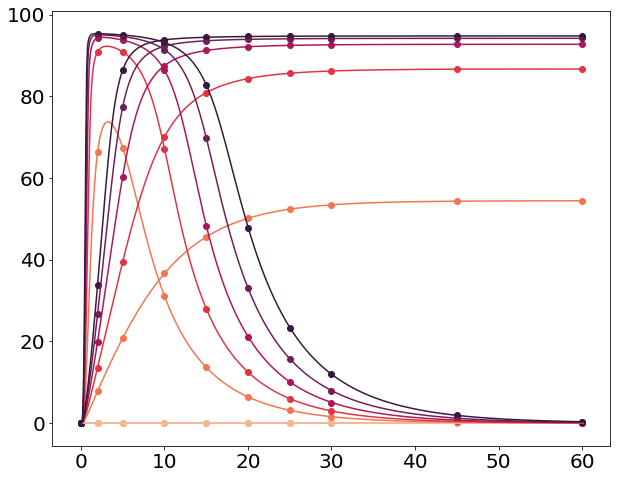

(0, 100)

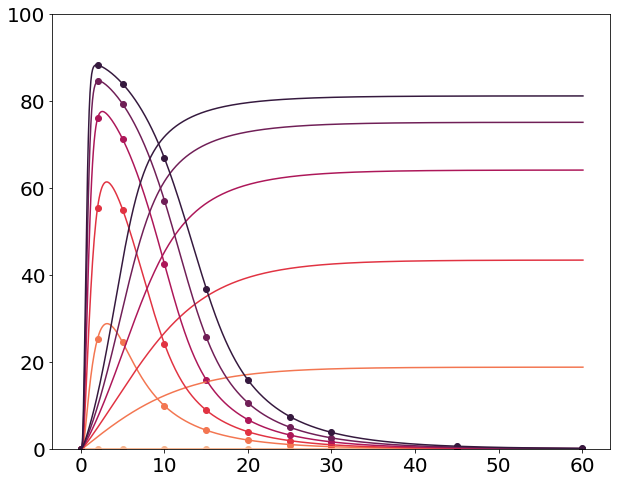

In [42]:
dt = 0.1
steps = 601
time = np.linspace(0,dt*steps,steps)

synth_params = top_params[3]
SYNTH_PARAMS = top_params[3]
timesc = np.asarray([0,2,5,10,15,20,25,30,45,60])

plt.rcParams['figure.figsize'] = [10.0, 8.0]

synth_wt = []
synth_t100a = []
for idx, sig in enumerate(params_constants[-1]):
    data = simulate_wt_experiment_a3_1D(initals, params_constants[:-1]+[sig], synth_params, time)
    active = data[:,2]
    synth_wt.append(data[:,2][[timesc*10]])
    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
    plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
    
    data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[sig], synth_params, time)
    active = data[:,2]
    synth_t100a.append(data[:,2][[timesc*10]])
    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
    plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
    
plt.show()

synth_map2k = []
for idx, sig in enumerate(params_constants[-1]):
    data = simulate_wt_experiment_a3_1D(initals, params_constants[:-1]+[sig], synth_params, time)
    active = data[:,1]
    synth_map2k.append(data[:,1][[timesc*10]])
    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
    plt.scatter(timesc, data[:,1][[timesc*10]], color=color_palette[idx])
    
    data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[sig], synth_params, time)
    map2k = data[:,1]
#     synth_t100a.append(data[:,2][[timesc*10]])
    plt.plot(time, map2k, label=str(sig)+' T100A active', color=color_palette[idx])
#     plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
plt.ylim(0,100)

In [43]:
scorefxn_time_new = timesc
scorefxn_data_new = [synth_wt, synth_t100a, synth_map2k]

# scorefxn_arr = [scorefxn_time, scorefxn_data]

# filename = 'C:/Users/sksuzuki/Desktop/killdevil/to/___.pickled'
# pickle.dump(scorefxn_arr, open(filename, 'wb'))

## Check fits 180913

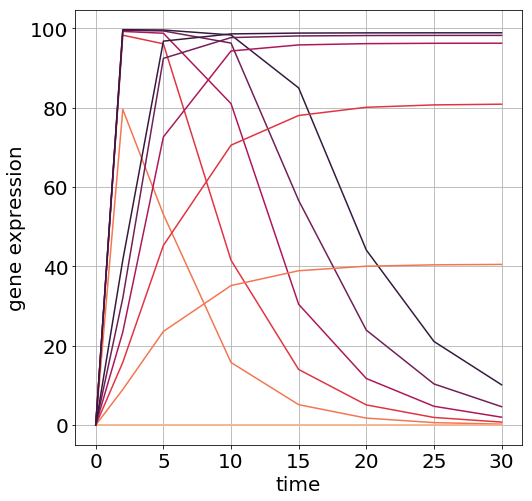

In [137]:
# scorefxn_arr = []
# scorefxn_time = []
# scorefxn_data = []

filename = 'C:/Users/sksuzuki/Desktop/killdevil/to/180910_synthdata_b0_a3_1D_k7.pickled'

scorefxn_arr = pickle.load(open(filename, 'rb'))
scorefxn_time, scorefxn_data = scorefxn_arr 

fig, axes = plt.subplots(1, 1, figsize=(8,8))
# use_consistent_colors = ['b','g']
for strain in scorefxn_data:
    for idx, exp in enumerate(strain):
        axes.plot(scorefxn_time, exp, '-', markersize=10,color=color_palette[idx])
axes.set_ylabel('gene expression', fontsize=20)
axes.set_xlabel('time', fontsize=20)
axes.grid()
plt.show()

In [138]:
folder = 'C:/Users/sksuzuki/Desktop/killdevil/from/180913_synthdata_b0_a3_1D_k7'

gen = 320
runs = 2000

MAP3K = 0
MAP2K = 0
MAPK = 0
X = 0

MAP3K_t=100
MAP2K_t=100
MAPK_t=100
X_t=100

s = [0, 150, 250, 350, 450, 550]


labelnames = ['B0', 'A3',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'k8',
              'K1', 'K3', 'K5', 'K7',
              'K2', 'K4', 'K6', 'K8'
                ]

mins = [ -4,  -4,   -4, -4, -4, -4,    -4, -4, -4, -4,     -4, -4, -4, -4,    -4, -4, -4, -4]

maxs = [4.5, 4.5,   4,  4,  4,  4,     4,  4,  4,  4,      4,  4,  4,  4,     4,  4,  4,  4]

diff = np.asarray(maxs)-np.asarray(mins)

# fb = 1
# t100a_fb = 0

initals = [MAP3K, MAP2K, MAPK, X]
params_constants = [MAP3K_t, MAP2K_t, MAPK_t, X_t, s] 
    
dt = 0.1
steps = 600
time = np.linspace(0,dt*steps,steps)

In [139]:
mse = []
params_from_file = []

empty_data = 0
for loaded_data in pathlib.Path(folder).glob('*.pickled'):
    if os.path.getsize(loaded_data) > 0:
        with open(loaded_data, 'rb') as f:
            new_data = pickle.load(f)
            mse.append(np.asarray(new_data[0]))
            params_from_file.append(np.asarray(new_data[1]))
    else:
        empty_data += 1

top = round((runs-empty_data)*0.05)
plt_top = round((runs-empty_data)*0.01)   
print('Plotting top ' +str(plt_top)+' runs')
    
new_params = []
last_mses = []
for i in range(len(params_from_file)):
    new_params.append(params_from_file[i][gen])
    last_mses.append(mse[i][gen])
last_mses = np.asarray(last_mses)
new_params = np.asarray(new_params)
new_params = new_params.T

idx_top = last_mses.argsort()[:top]

top_params = [([new_params[i][x] for i in range(len(new_params))]) for x in idx_top]
# top_params = []
# for idx in idx_top:
#     top_params.append(params_from_file[idx][100])

print('Best MSE: ' + str(np.min([mse[idx][gen] for idx in idx_top])))

Plotting top 20 runs
Best MSE: 88.0432902902


In [140]:
df_top_params = pd.DataFrame(top_params)
df_top_params.columns = labelnames
df_top_params_log = df_top_params.apply(np.log10)
df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

# of unstable WT experiments: 0 of 120
# of unstable T100A experiments: 0 of 120


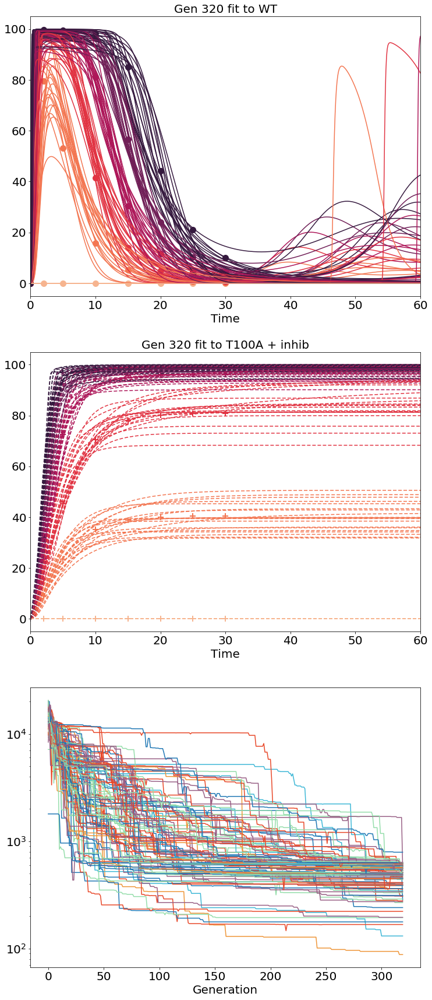

In [141]:
#initialize figure:
plt.clf()
fig, (ax1,ax2,ax3) = plt.subplots(3, 1, figsize=(12,30))


#plot 1
title_text = 'Gen ' + str(gen) + ' fit to WT'
ax1.set_title(title_text, fontsize=20)
ax1.set_xlabel('Time', fontsize=20)
# ax1.set_ylabel('gene expression', fontsize=20)
# ax1.set_xlim([0,150])1
# ax1.set_ylim([0,15])
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
color_palette = sns.color_palette("rocket", 6)[::-1]

# plot real data:
for idx, wt_data in enumerate(scorefxn_data[0]):
    ax1.plot(mapk_time, wt_data, 'o', markersize=10, color=color_palette[idx])
#     ax1.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])

# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax1.plot(time, active, color=color_palette[idx])
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax1.set_xlim(0,60)
print('# of unstable WT experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax1.legend(bbox_to_anchor=[1, 0.5], loc='center left')

#plot 2
title_text = 'Gen ' + str(gen) +  ' fit to T100A + inhib'
ax2.set_title(title_text, fontsize=20)
ax2.set_xlabel('Time', fontsize=20)

for idx, t100a_data in enumerate(scorefxn_data[1]):
    ax2.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_t100a_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax2.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax2.set_xlim(0,60)
print('# of unstable T100A experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax2.legend(bbox_to_anchor=[1, 0.5], loc='center left')
#plot2    
ax3.set_xlabel('Generation', fontsize=20)
# ax2.set_ylabel('Sum of MSE', fontsize=20)
# ax3.set_yscale('log')
# ax2.set_xlim([0,gen])
# ax2.set_ylim([10**3,10**5])
for idx in idx_top:
    ax3.semilogy([x for x in range(gen)], mse[idx][:gen])
    

plt.show()

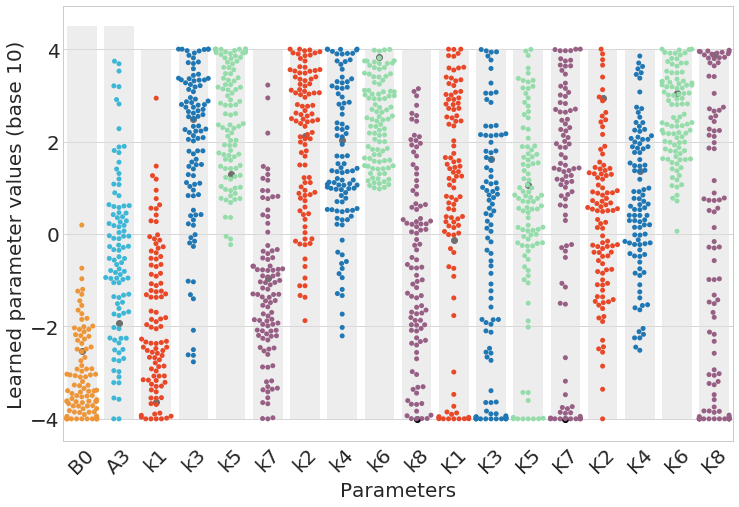

In [142]:
plt.rcParams['figure.figsize'] = [12.0, 8.0]

# positive 3db7d6
# negative ee9537
# hog1 ? 38bf85 or 94ddaa

colors = ['#ee9537', '#3db7d6',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728', '#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85']

pal = sns.set_palette(colors)

with sns.axes_style("whitegrid"):
    plt.scatter(range(0,len(labelnames)),np.log10(synth_params), color = 'black')
    plt.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
    
    x = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M)
    x.set_xticklabels(labelnames,rotation=45)
#     ax.set_yscale("log")
#     ax.set_ylim(0.00001,100000)
#     ax4.set_xticks(locs)
#     plt.xticklabels(labelnames, fontsize=18, rotation=90)
    plt.xlabel('Parameters', fontsize=20)
    plt.ylabel('Learned parameter values (base 10)', fontsize=20)
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

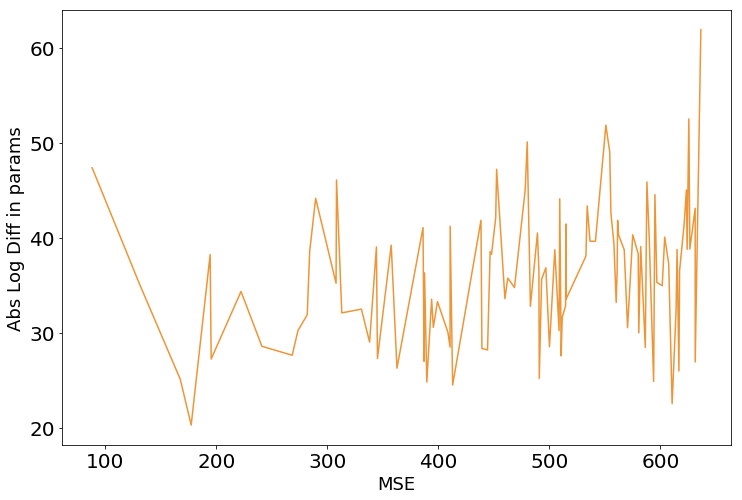

In [143]:
diff = []
for param_set in new_params.T:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
_top_mses = []
_top_params = []
for idx in idx_top: 
    _top_mses.append(mse[idx][gen])
    _top_params.append(new_params.T[idx])

diff = []
for param_set in _top_params:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
plt.plot(_top_mses, diff)
plt.xlabel('MSE')
plt.ylabel('Abs Log Diff in params')

## Check fits 180918

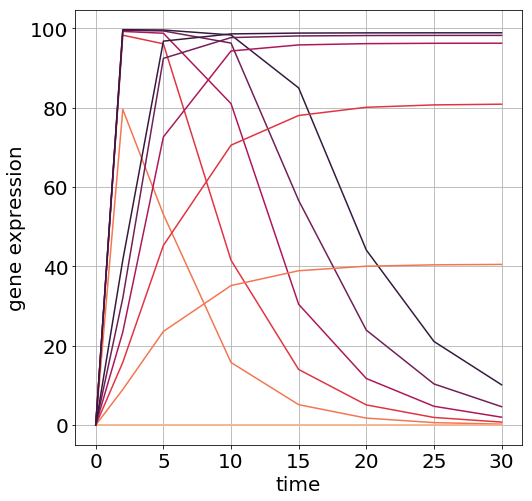

In [13]:
# scorefxn_arr = []
# scorefxn_time = []
# scorefxn_data = []

filename = 'C:/Users/sksuzuki/Desktop/killdevil/to/180910_synthdata_b0_a3_1D_k7.pickled'

scorefxn_arr = pickle.load(open(filename, 'rb'))
scorefxn_time, scorefxn_data = scorefxn_arr 

fig, axes = plt.subplots(1, 1, figsize=(8,8))
# use_consistent_colors = ['b','g']
for strain in scorefxn_data:
    for idx, exp in enumerate(strain):
        axes.plot(scorefxn_time, exp, '-', markersize=10,color=color_palette[idx])
axes.set_ylabel('gene expression', fontsize=20)
axes.set_xlabel('time', fontsize=20)
axes.grid()
plt.show()

In [14]:
folder = 'C:/Users/sksuzuki/Desktop/killdevil/from/180918_synthdata_b0_a3_1D_k7_1000g'

gen = 1000
runs = 2000

MAP3K = 0
MAP2K = 0
MAPK = 0
X = 0

MAP3K_t=100
MAP2K_t=100
MAPK_t=100
X_t=100

s = [0, 150, 250, 350, 450, 550]


labelnames = ['B0', 'A3',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'k8',
              'K1', 'K3', 'K5', 'K7',
              'K2', 'K4', 'K6', 'K8'
                ]

mins = [ -4,  -4,   -4, -4, -4, -4,    -4, -4, -4, -4,     -4, -4, -4, -4,    -4, -4, -4, -4]

maxs = [4.5, 4.5,   4,  4,  4,  4,     4,  4,  4,  4,      4,  4,  4,  4,     4,  4,  4,  4]

diff = np.asarray(maxs)-np.asarray(mins)

# fb = 1
# t100a_fb = 0

initals = [MAP3K, MAP2K, MAPK, X]
params_constants = [MAP3K_t, MAP2K_t, MAPK_t, X_t, s] 
    
dt = 0.1
steps = 600
time = np.linspace(0,dt*steps,steps)

In [20]:
mse = []
params_from_file = []

empty_data = 0
for loaded_data in pathlib.Path(folder).glob('*.pickled'):
    if os.path.getsize(loaded_data) > 0:
        with open(loaded_data, 'rb') as f:
            new_data = pickle.load(f)
            mse.append(np.asarray(new_data[0]))
            params_from_file.append(np.asarray(new_data[1]))
    else:
        empty_data += 1

top = round((runs-empty_data)*0.05)
plt_top = round((runs-empty_data)*0.01)   
print('Plotting top ' +str(plt_top)+' runs')
    
new_params = []
last_mses = []
for i in range(len(params_from_file)):
    new_params.append(params_from_file[i][gen])
    last_mses.append(mse[i][gen])
last_mses = np.asarray(last_mses)
new_params = np.asarray(new_params)
new_params = new_params.T

idx_top = last_mses.argsort()[:top]

top_params = [([new_params[i][x] for i in range(len(new_params))]) for x in idx_top]
# top_params = []
# for idx in idx_top:
#     top_params.append(params_from_file[idx][100])

print('Best MSE: ' + str(np.min([mse[idx][gen] for idx in idx_top])))

Plotting top 20 runs
Best MSE: 75.5426327933


In [21]:
df_top_params = pd.DataFrame(top_params)
df_top_params.columns = labelnames
df_top_params_log = df_top_params.apply(np.log10)
df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

# of unstable WT experiments: 0 of 120
# of unstable T100A experiments: 0 of 120
# of unstable MAP2K experiments: 0 of 120


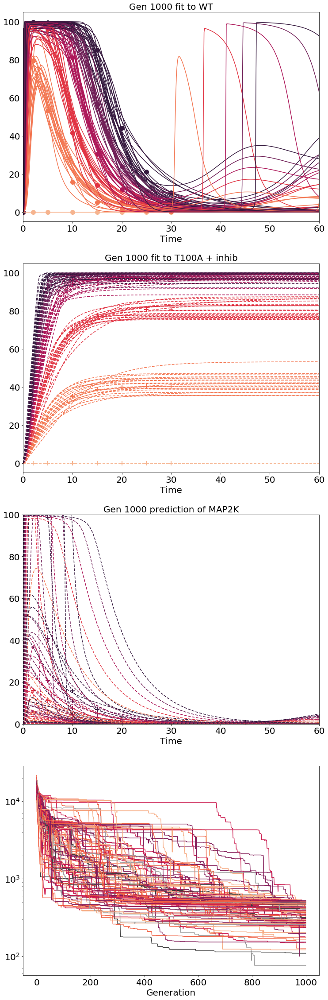

In [22]:
#initialize figure:
plt.clf()
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4, 1, figsize=(12,40))


#plot 1
title_text = 'Gen ' + str(gen) + ' fit to WT'
ax1.set_title(title_text, fontsize=20)
ax1.set_xlabel('Time', fontsize=20)
# ax1.set_ylabel('gene expression', fontsize=20)
# ax1.set_xlim([0,150])1
# ax1.set_ylim([0,15])
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
color_palette = sns.color_palette("rocket", 6)[::-1]

# plot real data:
for idx, wt_data in enumerate(scorefxn_data[0]):
    ax1.plot(scorefxn_time, wt_data, 'o', markersize=10, color=color_palette[idx])
#     ax1.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])

# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax1.plot(time, active, color=color_palette[idx])
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax1.set_xlim(0,60)
print('# of unstable WT experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax1.legend(bbox_to_anchor=[1, 0.5], loc='center left')

#plot 2
title_text = 'Gen ' + str(gen) +  ' fit to T100A + inhib'
ax2.set_title(title_text, fontsize=20)
ax2.set_xlabel('Time', fontsize=20)

for idx, t100a_data in enumerate(scorefxn_data[1]):
    ax2.plot(scorefxn_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_t100a_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax2.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax2.set_xlim(0,60)
print('# of unstable T100A experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax2.legend(bbox_to_anchor=[1, 0.5], loc='center left')


#plot 3
title_text = 'Gen ' + str(gen) +  ' prediction of MAP2K'
ax3.set_title(title_text, fontsize=20)
ax3.set_xlabel('Time', fontsize=20)

for idx, map2k_data in enumerate(scorefxn_data_new[2]):
    ax3.plot(scorefxn_time_new, map2k_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,1]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax3.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
ax3.set_ylim(0, 100)
ax3.set_xlim(0,60)
print('# of unstable MAP2K experiments: ' + str(unstable) + ' of ' + str(plt_top*6))


#plot 4  
ax4.set_xlabel('Generation', fontsize=20)
# ax2.set_ylabel('Sum of MSE', fontsize=20)
# ax3.set_yscale('log')
# ax2.set_xlim([0,gen])
# ax2.set_ylim([10**3,10**5])
for idx in idx_top:
    ax4.semilogy([x for x in range(gen)], mse[idx][:gen])
    

plt.show()

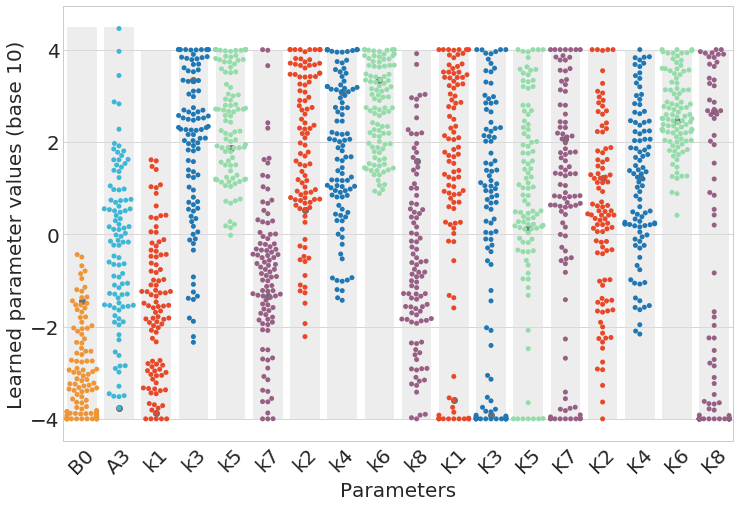

In [23]:
plt.rcParams['figure.figsize'] = [12.0, 8.0]

# positive 3db7d6
# negative ee9537
# hog1 ? 38bf85 or 94ddaa

colors = ['#ee9537', '#3db7d6',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728', '#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85']

pal = sns.set_palette(colors)

with sns.axes_style("whitegrid"):
    plt.scatter(range(0,len(labelnames)),np.log10(synth_params), color = 'black')
    plt.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
    
    x = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M)
    x.set_xticklabels(labelnames,rotation=45)
#     ax.set_yscale("log")
#     ax.set_ylim(0.00001,100000)
#     ax4.set_xticks(locs)
#     plt.xticklabels(labelnames, fontsize=18, rotation=90)
    plt.xlabel('Parameters', fontsize=20)
    plt.ylabel('Learned parameter values (base 10)', fontsize=20)
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

C:\Users\sksuzuki\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


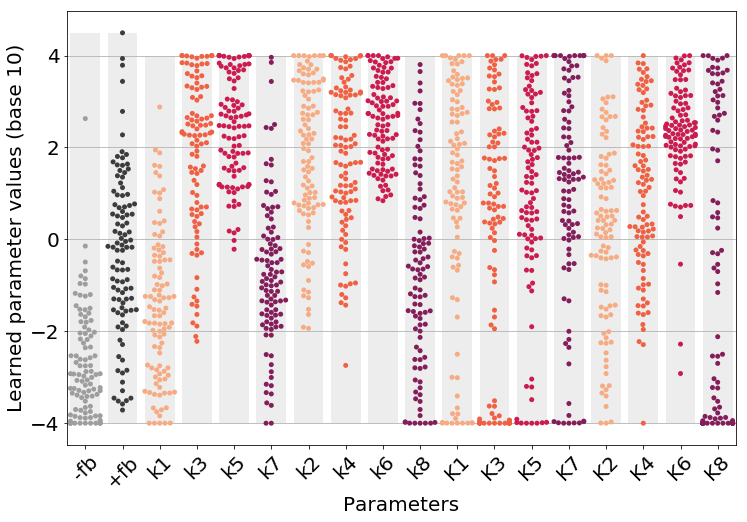

In [26]:
rocket = sns.color_palette("rocket", 5)#[::-1][:4]
rocket = rocket.as_hex()
rocket[::-1][:4]*4
colors = ['#9e9e9e','#3c3c3c'] + rocket[::-1][:4]*4
param_col = sns.set_palette(colors)
all_top_params = [params_from_file[x] for x in idx_top]
labelnames = ['-fb', '+fb',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'k8',
              'K1', 'K3', 'K5', 'K7',
              'K2', 'K4', 'K6', 'K8'
                ]
    
for i in range(0,500+1,5):
    plt.clf()
    top_params = [all_top_params[x][i] for x in range(100)]
    df_top_params = pd.DataFrame(top_params)
    df_top_params.columns = labelnames
    df_top_params_log = df_top_params.apply(np.log10)
    df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

    fig, (ax4) = plt.subplots(nrows=1, ncols=1, figsize=(12,8))
    

    ax4.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
    ax4 = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M, color=param_col)
    ax4.set_xticklabels(labelnames,rotation=45)
    #     ax.set_yscale("log")
    #     ax.set_ylim(0.00001,100000)
    #     ax4.set_xticks(locs)
    #     plt.xticklabels(labelnames, fontsize=18, rotation=90)
    ax4.set_xlabel('Parameters', fontsize=20)
    ax4.set_ylabel('Learned parameter values (base 10)', fontsize=20)
    #     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))
    ax4.yaxis.grid(True)
#     plt.show()
    plt.savefig("C:/Users/sksuzuki/Documents/Research/presentations/lab_meetings/Figures/181024/params_ranges/2/"+str(i)+".png",dpi=150)
    plt.ioff()

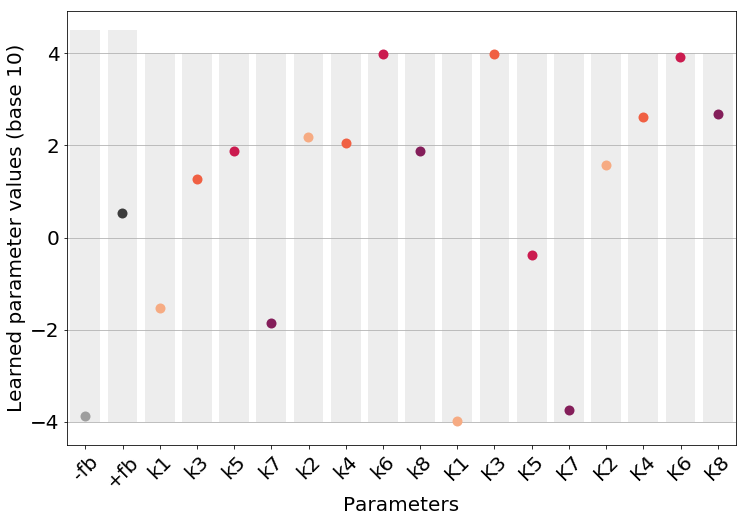

In [28]:
labelnames = ['-fb', '+fb',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'k8',
              'K1', 'K3', 'K5', 'K7',
              'K2', 'K4', 'K6', 'K8'
                ]

rocket = sns.color_palette("rocket", 5)#[::-1][:4]
rocket = rocket.as_hex()
rocket[::-1][:4]*4
colors = ['#9e9e9e','#3c3c3c'] + rocket[::-1][:4]*4
param_col = sns.set_palette(colors)
all_top_params = [params_from_file[x] for x in idx_top]
    
# for i in range(0,gen+1,5):
plt.clf()
top_params = [all_top_params[x][gen] for x in range(100)]
df_top_params = pd.DataFrame(top_params[17:18])
df_top_params.columns = labelnames
df_top_params_log = df_top_params.apply(np.log10)
df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

fig, (ax4) = plt.subplots(nrows=1, ncols=1, figsize=(12,8))


ax4.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
ax4 = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M, color=param_col, size=10)
ax4.set_xticklabels(labelnames,rotation=45)
#     ax.set_yscale("log")
#     ax.set_ylim(0.00001,100000)
#     ax4.set_xticks(locs)
#     plt.xticklabels(labelnames, fontsize=18, rotation=90)
ax4.set_xlabel('Parameters', fontsize=20)
ax4.set_ylabel('Learned parameter values (base 10)', fontsize=20)
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))
ax4.yaxis.grid(True)
# plt.show()
plt.savefig("C:/Users/sksuzuki/Documents/Research/presentations/lab_meetings/Figures/181024/param_individ.png",dpi=150)
#     plt.ioff()

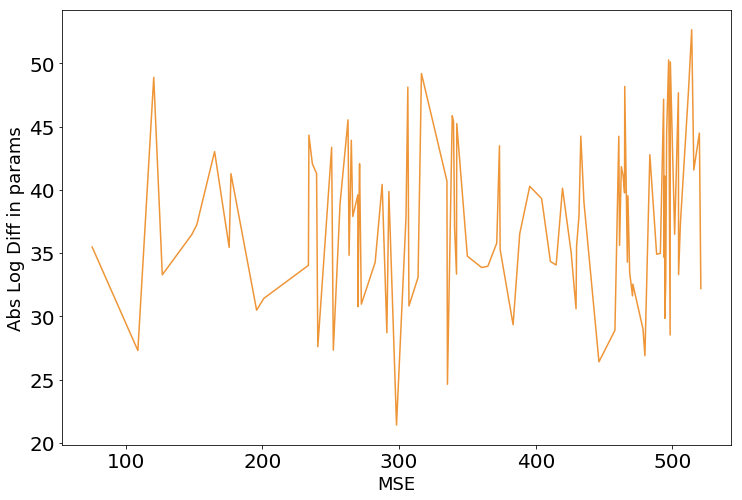

In [66]:
diff = []
for param_set in new_params.T:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
_top_mses = []
_top_params = []
for idx in idx_top: 
    _top_mses.append(mse[idx][gen])
    _top_params.append(new_params.T[idx])

diff = []
for param_set in _top_params:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
plt.plot(_top_mses, diff)
plt.xlabel('MSE')
plt.ylabel('Abs Log Diff in params')

## Check fits 180918 - map2k data

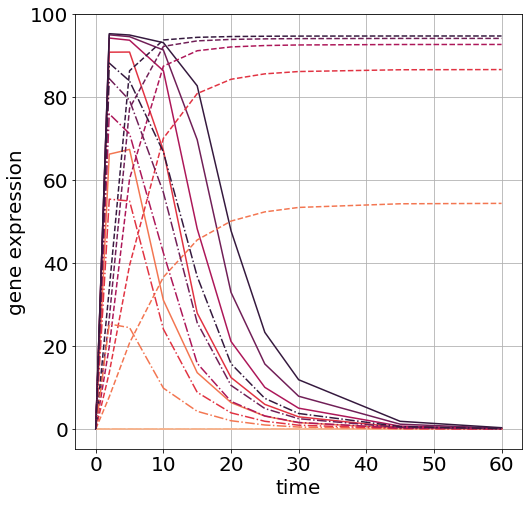

In [73]:
# scorefxn_arr = []
# scorefxn_time = []
# scorefxn_data = []

filename = 'C:/Users/sksuzuki/Desktop/killdevil/from/180918_synthdata_wt_t100a_map2k_b0_a3_1D_k7.pickled'

scorefxn_arr = pickle.load(open(filename, 'rb'))
scorefxn_time, scorefxn_data = scorefxn_arr 

fig, axes = plt.subplots(1, 1, figsize=(8,8))
# use_consistent_colors = ['b','g']
for strain,dash in zip(scorefxn_data, ['-','--','-.']):
    for idx, exp in enumerate(strain):
        axes.plot(scorefxn_time, exp, dash, markersize=10,color=color_palette[idx])
#     print(len(strain))
axes.set_ylabel('gene expression', fontsize=20)
axes.set_xlabel('time', fontsize=20)
axes.grid()
plt.show()

In [74]:
folder = 'C:/Users/sksuzuki/Desktop/killdevil/from/180918_synthdata_wt_t100a_map2k_b0_a3_1D_k7_1000g'

gen = 1000
runs = 2822

MAP3K = 0
MAP2K = 0
MAPK = 0
X = 0

MAP3K_t=100
MAP2K_t=100
MAPK_t=100
X_t=100

s = [0, 150, 250, 350, 450, 550]


labelnames = ['B0', 'A3',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'k8',
              'K1', 'K3', 'K5', 'K7',
              'K2', 'K4', 'K6', 'K8'
                ]

mins = [ -4,  -4,   -4, -4, -4, -4,    -4, -4, -4, -4,     -4, -4, -4, -4,    -4, -4, -4, -4]

maxs = [4.5, 4.5,   4,  4,  4,  4,     4,  4,  4,  4,      4,  4,  4,  4,     4,  4,  4,  4]

diff = np.asarray(maxs)-np.asarray(mins)

# fb = 1
# t100a_fb = 0

initals = [MAP3K, MAP2K, MAPK, X]
params_constants = [MAP3K_t, MAP2K_t, MAPK_t, X_t, s] 
    
dt = 0.1
steps = 600
time = np.linspace(0,dt*steps,steps)

In [75]:
mse = []
params_from_file = []

empty_data = 0
for loaded_data in pathlib.Path(folder).glob('*.pickled'):
    if os.path.getsize(loaded_data) > 0:
        with open(loaded_data, 'rb') as f:
            new_data = pickle.load(f)
            mse.append(np.asarray(new_data[0]))
            params_from_file.append(np.asarray(new_data[1]))
    else:
        empty_data += 1

top = round((runs-empty_data)*0.05)
plt_top = round((runs-empty_data)*0.01)   
print('Plotting top ' +str(plt_top)+' runs')
    
new_params = []
last_mses = []
for i in range(len(params_from_file)):
    new_params.append(params_from_file[i][gen])
    last_mses.append(mse[i][gen])
last_mses = np.asarray(last_mses)
new_params = np.asarray(new_params)
new_params = new_params.T

idx_top = last_mses.argsort()[:top]

top_params = [([new_params[i][x] for i in range(len(new_params))]) for x in idx_top]
# top_params = []
# for idx in idx_top:
#     top_params.append(params_from_file[idx][100])

print('Best MSE: ' + str(np.min([mse[idx][gen] for idx in idx_top])))

Plotting top 28 runs
Best MSE: 138.687835499


In [76]:
df_top_params = pd.DataFrame(top_params)
df_top_params.columns = labelnames
df_top_params_log = df_top_params.apply(np.log10)
df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

# of unstable WT experiments: 0 of 168
# of unstable T100A experiments: 0 of 168
# of unstable MAP2K experiments: 0 of 168


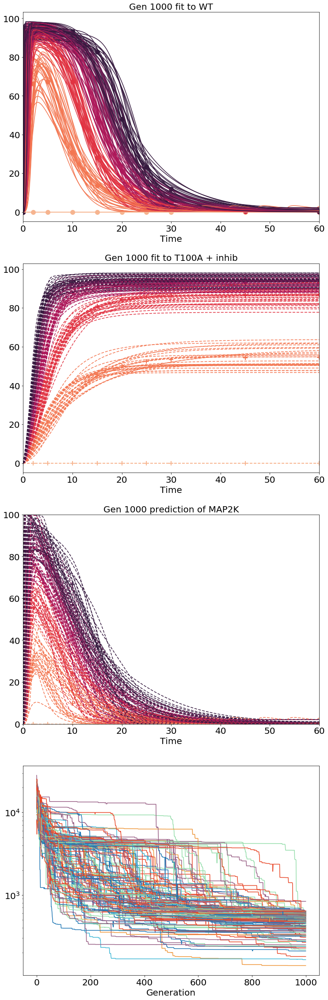

In [77]:
#initialize figure:
plt.clf()
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4, 1, figsize=(12,40))


#plot 1
title_text = 'Gen ' + str(gen) + ' fit to WT'
ax1.set_title(title_text, fontsize=20)
ax1.set_xlabel('Time', fontsize=20)
# ax1.set_ylabel('gene expression', fontsize=20)
# ax1.set_xlim([0,150])1
# ax1.set_ylim([0,15])
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
color_palette = sns.color_palette("rocket", 6)[::-1]

# plot real data:
for idx, wt_data in enumerate(scorefxn_data[0]):
    ax1.plot(scorefxn_time, wt_data, 'o', markersize=10, color=color_palette[idx])
#     ax1.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])

# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax1.plot(time, active, color=color_palette[idx])
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax1.set_xlim(0,60)
print('# of unstable WT experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax1.legend(bbox_to_anchor=[1, 0.5], loc='center left')

#plot 2
title_text = 'Gen ' + str(gen) +  ' fit to T100A + inhib'
ax2.set_title(title_text, fontsize=20)
ax2.set_xlabel('Time', fontsize=20)

for idx, t100a_data in enumerate(scorefxn_data[1]):
    ax2.plot(scorefxn_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_t100a_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax2.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax2.set_xlim(0,60)
print('# of unstable T100A experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax2.legend(bbox_to_anchor=[1, 0.5], loc='center left')


#plot 3
title_text = 'Gen ' + str(gen) +  ' prediction of MAP2K'
ax3.set_title(title_text, fontsize=20)
ax3.set_xlabel('Time', fontsize=20)

for idx, map2k_data in enumerate(scorefxn_data_new[2]):
    ax3.plot(scorefxn_time_new, map2k_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,1]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax3.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
ax3.set_ylim(0, 100)
ax3.set_xlim(0,60)
print('# of unstable MAP2K experiments: ' + str(unstable) + ' of ' + str(plt_top*6))


#plot 4  
ax4.set_xlabel('Generation', fontsize=20)
# ax2.set_ylabel('Sum of MSE', fontsize=20)
# ax3.set_yscale('log')
# ax2.set_xlim([0,gen])
# ax2.set_ylim([10**3,10**5])
for idx in idx_top:
    ax4.semilogy([x for x in range(gen)], mse[idx][:gen])
    

plt.show()

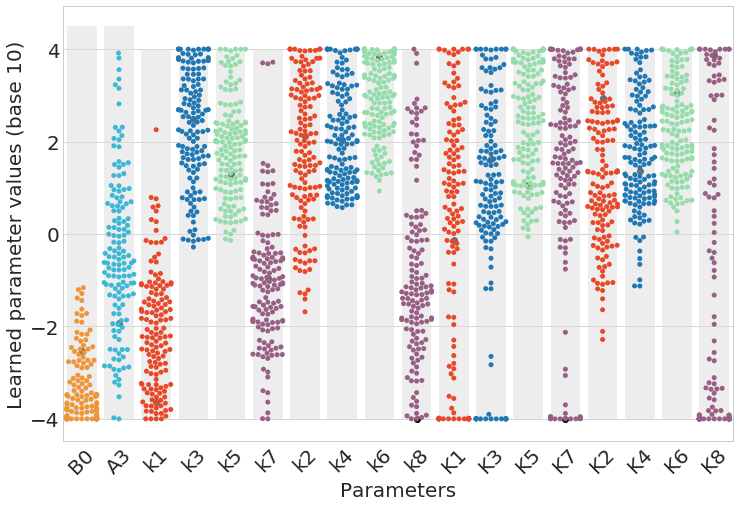

In [78]:
plt.rcParams['figure.figsize'] = [12.0, 8.0]

# positive 3db7d6
# negative ee9537
# hog1 ? 38bf85 or 94ddaa

colors = ['#ee9537', '#3db7d6',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728', '#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85']

pal = sns.set_palette(colors)

with sns.axes_style("whitegrid"):
    plt.scatter(range(0,len(labelnames)),np.log10(synth_params), color = 'black')
    plt.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
    
    x = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M)
    x.set_xticklabels(labelnames,rotation=45)
#     ax.set_yscale("log")
#     ax.set_ylim(0.00001,100000)
#     ax4.set_xticks(locs)
#     plt.xticklabels(labelnames, fontsize=18, rotation=90)
    plt.xlabel('Parameters', fontsize=20)
    plt.ylabel('Learned parameter values (base 10)', fontsize=20)
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

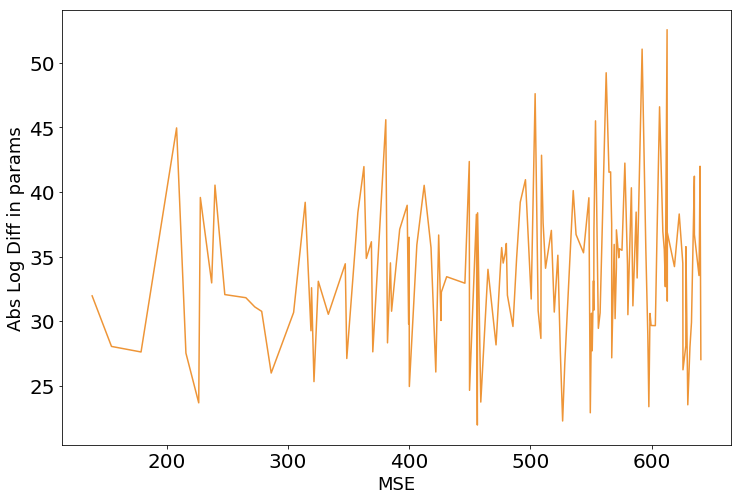

In [79]:
diff = []
for param_set in new_params.T:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
_top_mses = []
_top_params = []
for idx in idx_top: 
    _top_mses.append(mse[idx][gen])
    _top_params.append(new_params.T[idx])

diff = []
for param_set in _top_params:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
plt.plot(_top_mses, diff)
plt.xlabel('MSE')
plt.ylabel('Abs Log Diff in params')

## Check fits 180928 - map2k data + smaller range

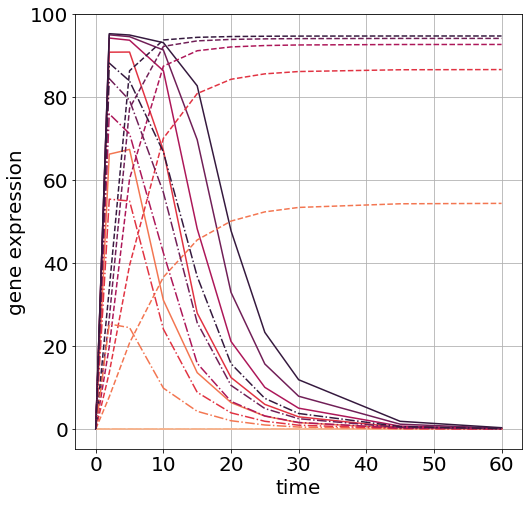

In [11]:
# scorefxn_arr = []
# scorefxn_time = []
# scorefxn_data = []

filename = 'C:/Users/sksuzuki/Desktop/killdevil/from/180918_synthdata_wt_t100a_map2k_b0_a3_1D_k7.pickled'

scorefxn_arr = pickle.load(open(filename, 'rb'))
scorefxn_time, scorefxn_data = scorefxn_arr 

fig, axes = plt.subplots(1, 1, figsize=(8,8))
# use_consistent_colors = ['b','g']
for strain,dash in zip(scorefxn_data, ['-','--','-.']):
    for idx, exp in enumerate(strain):
        axes.plot(scorefxn_time, exp, dash, markersize=10,color=color_palette[idx])
#     print(len(strain))
axes.set_ylabel('gene expression', fontsize=20)
axes.set_xlabel('time', fontsize=20)
axes.grid()
plt.show()

In [26]:
folder = 'C:/Users/sksuzuki/Desktop/killdevil/from/180928_synthdata_wt_t100a_map2k_b0_a3_1D_k7_smrg'

gen = 500
runs = 2000

MAP3K = 0
MAP2K = 0
MAPK = 0
X = 0

MAP3K_t=100
MAP2K_t=100
MAPK_t=100
X_t=100

s = [0, 150, 250, 350, 450, 550]


labelnames = ['B0', 'A3',
              'k1', 'k3', 'k5', 'k7',
              'k2', 'k4', 'k6', 'k8',
              'K1', 'K3', 'K5', 'K7',
              'K2', 'K4', 'K6', 'K8'
                ]

mins = [-4, -4,
        -4,  0,  0, -3,
        -1,  0,  1, -4,
        -4, -4,  0, -4,
        -2, -1,  0, -4]

maxs = [1, 4,
        1, 4, 4, 2,
        4, 4, 4, 3,
        4, 4, 4, 4,
        4, 4, 4, 4]

diff = np.asarray(maxs)-np.asarray(mins)

# fb = 1
# t100a_fb = 0

initals = [MAP3K, MAP2K, MAPK, X]
params_constants = [MAP3K_t, MAP2K_t, MAPK_t, X_t, s] 
    
dt = 0.1
steps = 600
time = np.linspace(0,dt*steps,steps)

In [31]:
mse = []
params_from_file = []

empty_data = 0
for loaded_data in pathlib.Path(folder).glob('*.pickled'):
    if os.path.getsize(loaded_data) > 0:
        with open(loaded_data, 'rb') as f:
            new_data = pickle.load(f)
            mse.append(np.asarray(new_data[0]))
            params_from_file.append(np.asarray(new_data[1]))
    else:
        empty_data += 1

top = round((runs-empty_data)*0.02)
plt_top = round((runs-empty_data)*0.01)   
print('Plotting top ' +str(plt_top)+' runs')
    
new_params = []
last_mses = []
for i in range(len(params_from_file)):
    new_params.append(params_from_file[i][gen])
    last_mses.append(mse[i][gen])
last_mses = np.asarray(last_mses)
new_params = np.asarray(new_params)
new_params = new_params.T

idx_top = last_mses.argsort()[:top]

top_params = [([new_params[i][x] for i in range(len(new_params))]) for x in idx_top]
# top_params = []
# for idx in idx_top:
#     top_params.append(params_from_file[idx][100])

print('Best MSE: ' + str(np.min([mse[idx][gen] for idx in idx_top])))

Plotting top 20 runs
Best MSE: 129.597911344


In [32]:
df_top_params = pd.DataFrame(top_params)
df_top_params.columns = labelnames
df_top_params_log = df_top_params.apply(np.log10)
df_top_params_log_M = df_top_params_log.melt(var_name='param', value_name='vals')

# of unstable WT experiments: 0 of 120
# of unstable T100A experiments: 0 of 120
# of unstable MAP2K experiments: 0 of 120


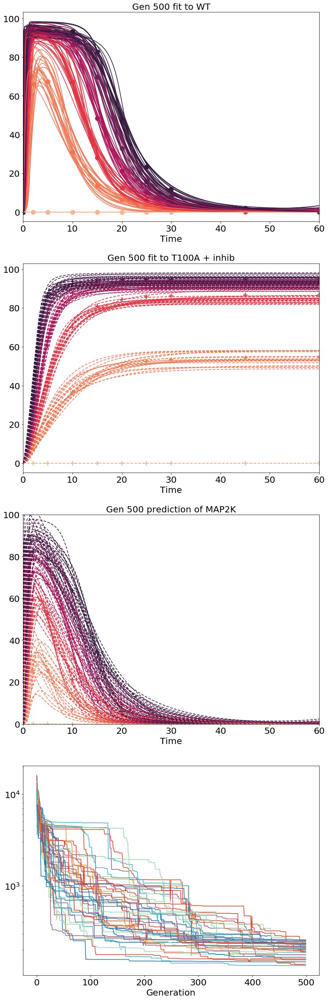

In [33]:
#initialize figure:
plt.clf()
fig, (ax1,ax2,ax3,ax4) = plt.subplots(4, 1, figsize=(12,40))


#plot 1
title_text = 'Gen ' + str(gen) + ' fit to WT'
ax1.set_title(title_text, fontsize=20)
ax1.set_xlabel('Time', fontsize=20)
# ax1.set_ylabel('gene expression', fontsize=20)
# ax1.set_xlim([0,150])1
# ax1.set_ylim([0,15])
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)
color_palette = sns.color_palette("rocket", 6)[::-1]

# plot real data:
for idx, wt_data in enumerate(scorefxn_data[0]):
    ax1.plot(scorefxn_time, wt_data, 'o', markersize=10, color=color_palette[idx])
#     ax1.plot(mapk_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])

# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax1.plot(time, active, color=color_palette[idx])
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax1.set_xlim(0,60)
print('# of unstable WT experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax1.legend(bbox_to_anchor=[1, 0.5], loc='center left')

#plot 2
title_text = 'Gen ' + str(gen) +  ' fit to T100A + inhib'
ax2.set_title(title_text, fontsize=20)
ax2.set_xlabel('Time', fontsize=20)

for idx, t100a_data in enumerate(scorefxn_data[1]):
    ax2.plot(scorefxn_time, t100a_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_t100a_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,2]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax2.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
# ax1.set_ylim(0, 100)
ax2.set_xlim(0,60)
print('# of unstable T100A experiments: ' + str(unstable) + ' of ' + str(plt_top*6))
# ax2.legend(bbox_to_anchor=[1, 0.5], loc='center left')


#plot 3
title_text = 'Gen ' + str(gen) +  ' prediction of MAP2K'
ax3.set_title(title_text, fontsize=20)
ax3.set_xlabel('Time', fontsize=20)

for idx, map2k_data in enumerate(scorefxn_data_new[2]):
    ax3.plot(scorefxn_time_new, map2k_data, '+', mew=2, markersize=10, color=color_palette[idx])
    
# plot evolutionary algorithm data:
unstable = 0
for idx in idx_top[:plt_top]:
    learned_params = params_from_file[idx][gen]
    for idx, sig in enumerate(params_constants[-1]):
        params_c = params_constants[:-1]+[sig]
        data = simulate_wt_experiment_a3_1D(initals, params_c, learned_params, time)
        active = data[:,1]
        if len([*filter(lambda x: x <= 100, active)]) == len(active) and len([*filter(lambda x: x >= 0, active)]) == len(active):
            ax3.plot(time, active, dashes= [4,2], color=color_palette[idx], label = 'ppMAPK at '  + str(sig))
        else:
            unstable += 1
ax3.set_ylim(0, 100)
ax3.set_xlim(0,60)
print('# of unstable MAP2K experiments: ' + str(unstable) + ' of ' + str(plt_top*6))


#plot 4  
ax4.set_xlabel('Generation', fontsize=20)
# ax2.set_ylabel('Sum of MSE', fontsize=20)
# ax3.set_yscale('log')
# ax2.set_xlim([0,gen])
# ax2.set_ylim([10**3,10**5])
for idx in idx_top:
    ax4.semilogy([x for x in range(gen)], mse[idx][:gen])
    

plt.show()

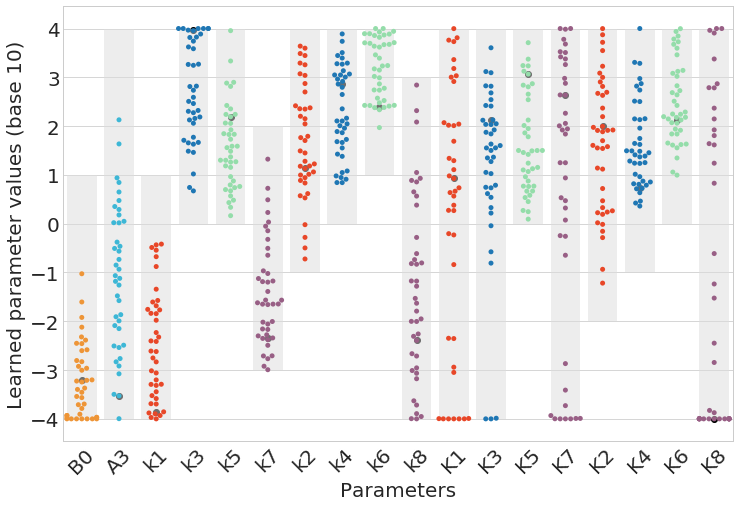

In [34]:
plt.rcParams['figure.figsize'] = [12.0, 8.0]

# positive 3db7d6
# negative ee9537
# hog1 ? 38bf85 or 94ddaa

colors = ['#ee9537', '#3db7d6',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85',
          '#e84728', '#1f77b4','#94ddaa','#985f85',
          '#e84728','#1f77b4','#94ddaa','#985f85']

pal = sns.set_palette(colors)

with sns.axes_style("whitegrid"):
    plt.scatter(range(0,len(labelnames)),np.log10(synth_params), color = 'black')
    plt.bar(range(0,len(labelnames)),height=diff,bottom=mins,align='center',tick_label=labelnames, color='#DCDCDC',alpha = 0.5)
    
    x = sns.swarmplot(x='param',y='vals', data = df_top_params_log_M)
    x.set_xticklabels(labelnames,rotation=45)
#     ax.set_yscale("log")
#     ax.set_ylim(0.00001,100000)
#     ax4.set_xticks(locs)
#     plt.xticklabels(labelnames, fontsize=18, rotation=90)
    plt.xlabel('Parameters', fontsize=20)
    plt.ylabel('Learned parameter values (base 10)', fontsize=20)
#     ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

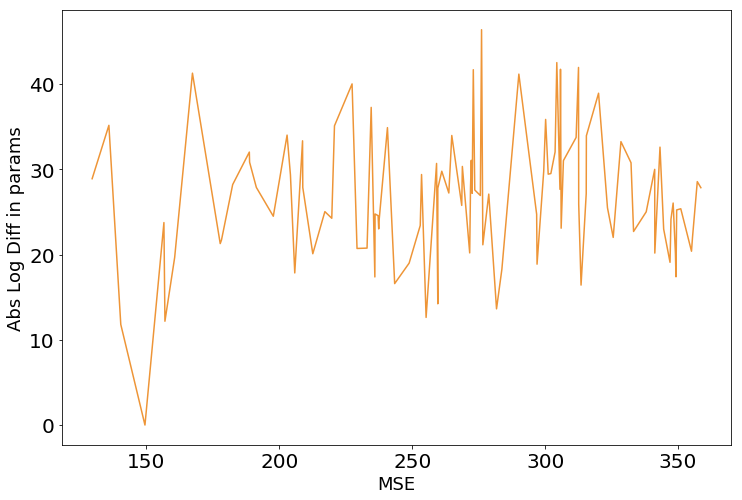

In [25]:
diff = []
for param_set in new_params.T:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
_top_mses = []
_top_params = []
for idx in idx_top: 
    _top_mses.append(mse[idx][gen])
    _top_params.append(new_params.T[idx])

diff = []
for param_set in _top_params:
    _d = 0
    for x, y in zip(param_set, synth_params):
        _d += abs(np.log10(x/y))
    diff.append(_d)
    
plt.plot(_top_mses, diff)
plt.xlabel('MSE')
plt.ylabel('Abs Log Diff in params')

# Playing with Parameters and Models

B0 x 10 = wt repression

B0 x 0.1 = wt activation

A3 x 10 = wt repression

A3 x 0.1 = wt activation

k1 x 10 = t100a activation

k1 x 0.1 = t100a repression

k3 x 10 = wt and t100a activation

k3 x 0.1 = wt and t100a repression

k5 x 10 = wt and t100a activation

k5 x 0.1 = wt and t100a repression

k7
k7

k9
k9

k2
k2

k4
k4

k6
k6

k8
k8

k10
k10

k1
k1

k3
k3

k5
k5

k7
k7

k9
k9

k2
k2

k4
k4

k6
k6

k8
k8

k10
k10


[0.0029588800827973685, 0.012112138800907163, 0.00023481531506867081, 311.65437579294962, 20.216367659054534, 0.10971722617866624, 129.70369943155902, 108.97732361327013, 6634.3132502604594, 0.00010039834663900335, 0.75204204522899465, 41.564680292557291, 11.570923836091632, 0.00010081207185935826, 883.50887257730767, 22.888457311116095, 1138.5591403190585, 7437.8949813729732]
[0.002958, 0.01211213, 0.000234815, 311.65, 2.0216000000000003, 0.10971722617866624, 129.70369943155902, 108.97732361327013, 6634.3132502604594, 0.00010039834663900335, 0.75204204522899465, 41.564680292557291, 11.570923836091632, 0.00010081207185935826, 883.50887257730767, 22.888457311116095, 1138.5591403190585, 7437.8949813729732]


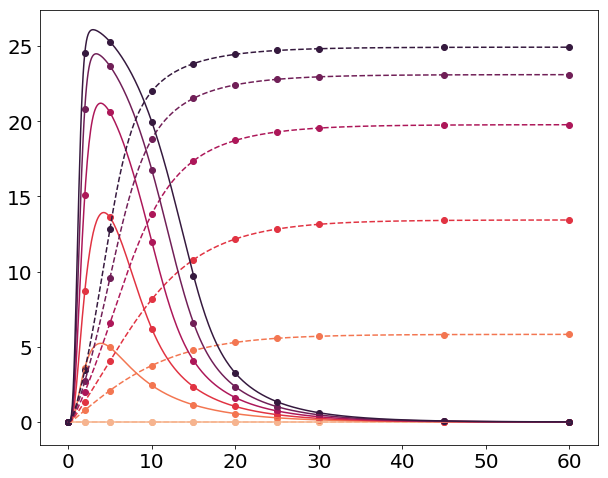

(0, 100)

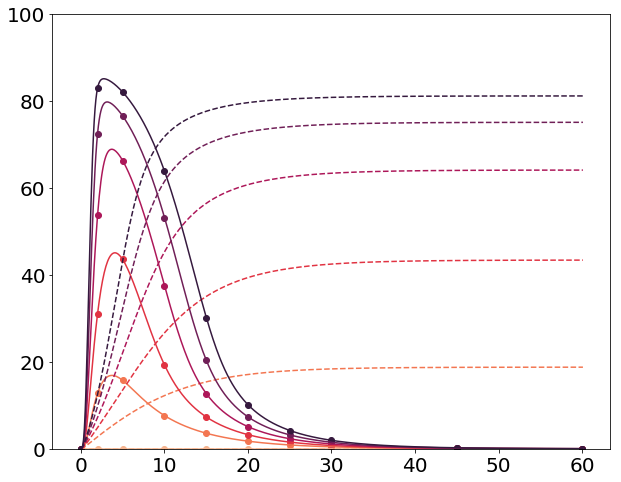

In [43]:
print(synth_params)

SYNTH_PARAMS=[0.002958] + [0.01211213] + [0.000234815] + [311.65] + [20.216*0.1] + synth_params[5:]
print(SYNTH_PARAMS)

for idx, sig in enumerate(params_constants[-1]):
    data = simulate_wt_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    active = data[:,2]

    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
    plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
    
    data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    active = data[:,2]
    plt.plot(time, active, '--', label=str(sig)+' T100A active', color=color_palette[idx])
    plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
plt.show()

for idx, sig in enumerate(params_constants[-1]):
    data = simulate_wt_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    active = data[:,1]
    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
    plt.scatter(timesc, data[:,1][[timesc*10]], color=color_palette[idx])
    
    data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    map2k = data[:,1]
#     synth_t100a.append(data[:,2][[timesc*10]])
    plt.plot(time, map2k, '--', label=str(sig)+' T100A active', color=color_palette[idx])
#     plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
plt.ylim(0,100)

# uM

In [86]:
MAP3K_t = molarity_conversion(1170)
MAP2K_t = molarity_conversion(2282)
MAPK_t = molarity_conversion(5984)
X_t = 100

s = [0, 150000, 250000, 350000, 450000, 550000]

initals = [MAP3K, MAP2K, MAPK, X]
params_constants = [MAP3K_t, MAP2K_t, MAPK_t, X_t, s]

timesc = np.asarray([0,2,5,10,15,20,25,30,45,60])

dt = 0.1
steps = 601
time = np.linspace(0,dt*steps,steps)

labelnames = ['B0', 'A3',
              'k1', 'k3', 'k5', 'k7', 
              'k2', 'k4', 'k6', 'k8', 
              'K1', 'K3', 'K5', 'K7', 
              'K2', 'K4', 'K6', 'K8']

[0.0029588800827973685, 0.012112138800907163, 0.00023481531506867081, 311.65437579294962, 20.216367659054534, 0.10971722617866624, 129.70369943155902, 108.97732361327013, 6634.3132502604594, 0.00010039834663900335, 0.75204204522899465, 41.564680292557291, 11.570923836091632, 0.00010081207185935826, 883.50887257730767, 22.888457311116095, 1138.5591403190585, 7437.8949813729732]
[0.0002958880082797368, 120.11213880090716, 0.16, 0.18, 0.22, 0.10971722617866624, 0.012970369943155901, 0.01, 0.014, 0.00010039834663900335, 0.7520420452289946, 41.56468029255729, 11.570923836091632, 0.00010081207185935826, 883.5088725773077, 22.888457311116095, 1138.5591403190585, 7437.894981372973]


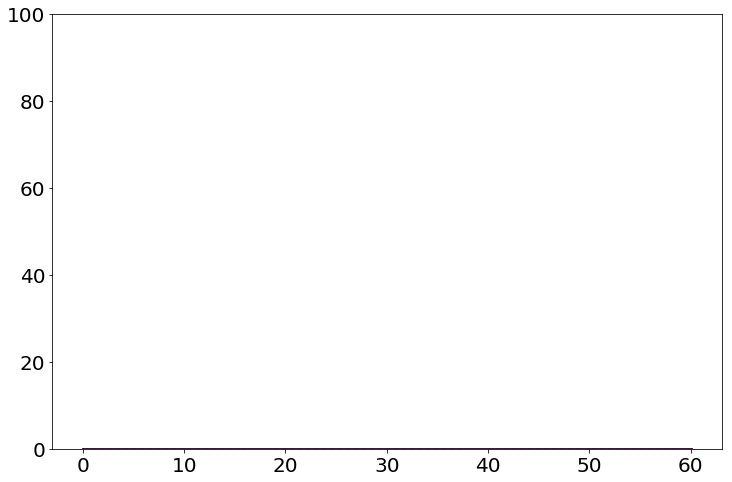

(0, 100)

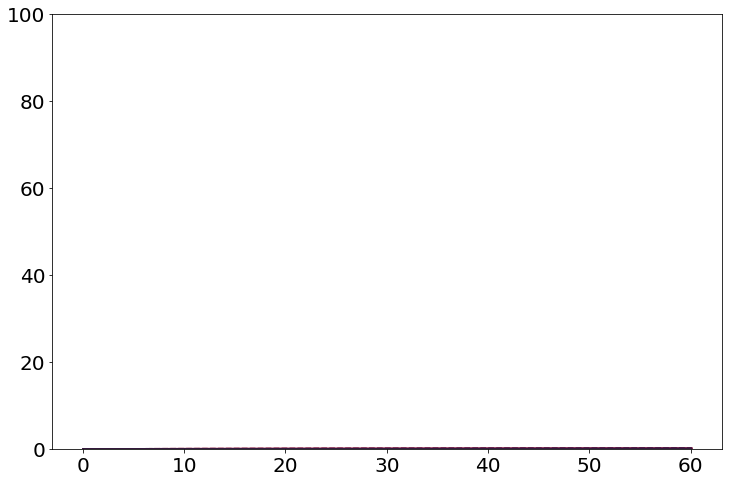

In [106]:
print(synth_params)

SYNTH_PARAMS=[0.00029588800827973685, 120.112138800907163, 
              0.16, 0.18, 0.22, 0.10971722617866624, 
              0.012970369943155902, 0.01, 0.014, 0.00010039834663900335, 
              0.75204204522899465, 41.564680292557291, 11.570923836091632, 0.00010081207185935826, 
              883.50887257730767, 22.888457311116095, 1138.5591403190585, 7437.8949813729732]
print(SYNTH_PARAMS)

for idx, sig in enumerate(params_constants[-1]):
    data = simulate_wt_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    active = data[:,2]/params_constants[2]*100

    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
#     plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
    
    data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    active = data[:,2]/params_constants[2]*100
    plt.plot(time, active, '--', label=str(sig)+' T100A active', color=color_palette[idx])
#     plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
plt.ylim(0,100)
plt.show()

for idx, sig in enumerate(params_constants[-1]):
    data = simulate_wt_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    active = data[:,1]/params_constants[1]*100
    plt.plot(time, active, label=str(sig)+' T100A active', color=color_palette[idx])
#     plt.scatter(timesc, data[:,1][[timesc*10]], color=color_palette[idx])
    
    data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[sig], SYNTH_PARAMS, time)
    map2k = data[:,1]/params_constants[1]*100
#     synth_t100a.append(data[:,2][[timesc*10]])
    plt.plot(time, map2k, '--', label=str(sig)+' T100A active', color=color_palette[idx])
#     plt.scatter(timesc, data[:,2][[timesc*10]], color=color_palette[idx])
plt.ylim(0,100)

# Comparing each parameter to MSE

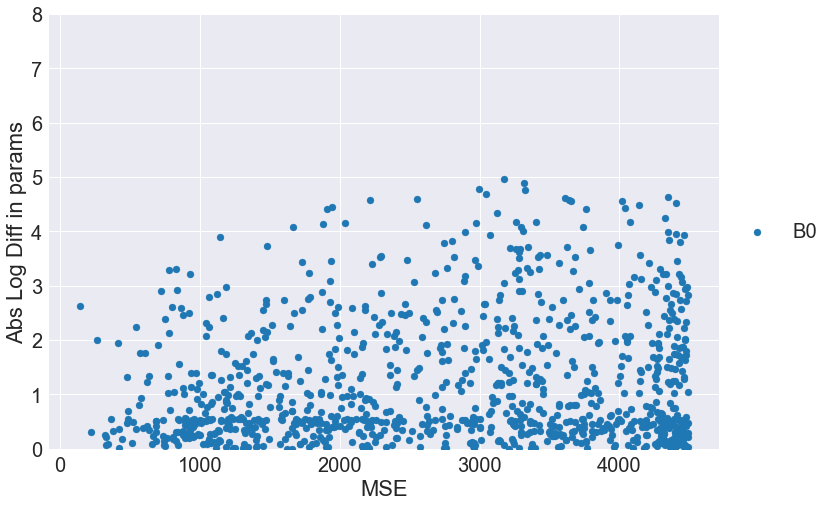

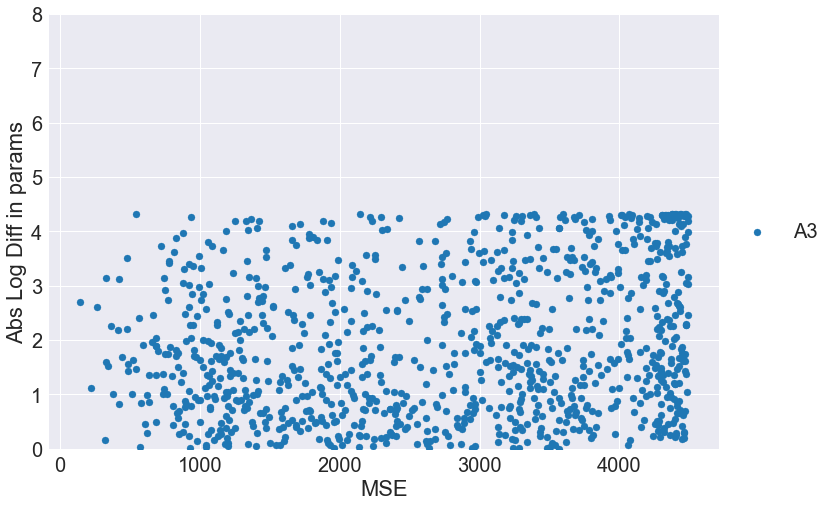

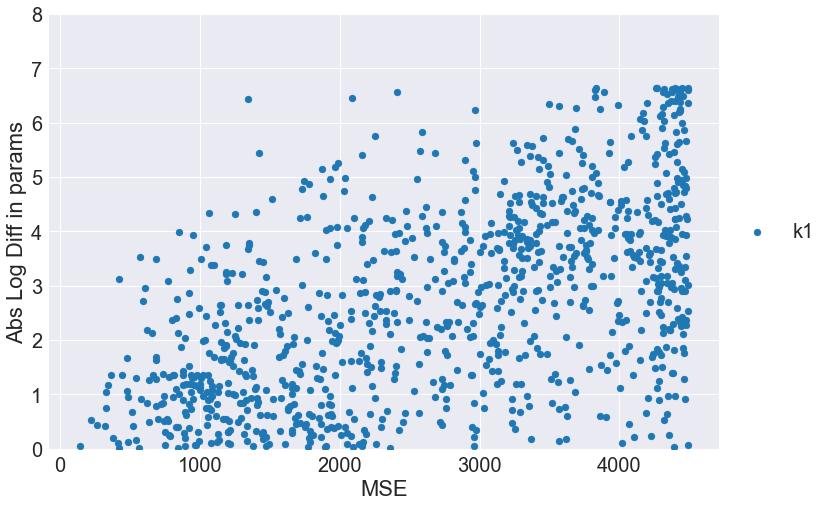

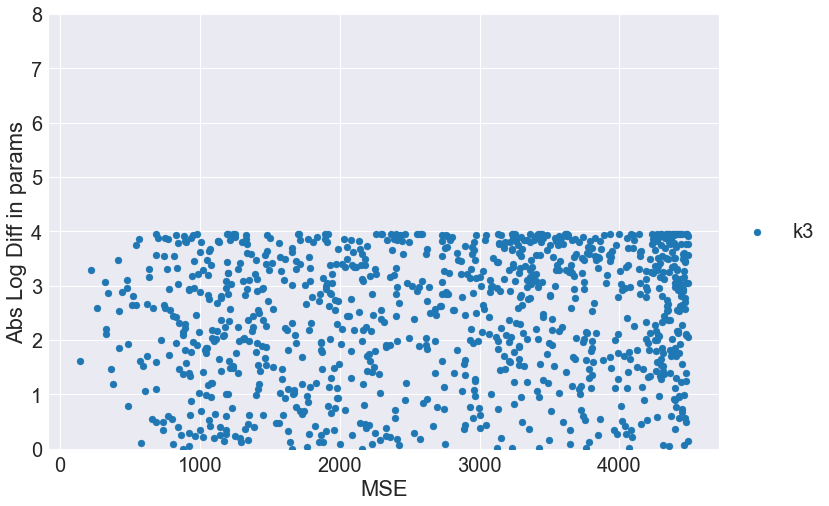

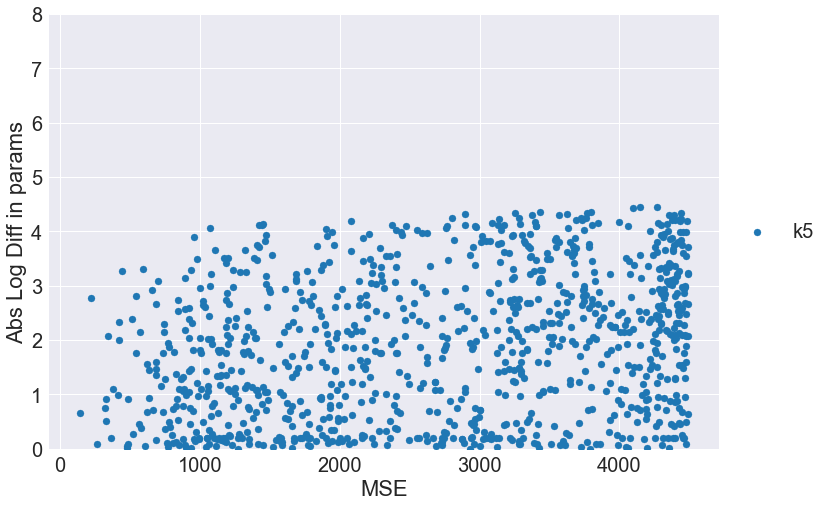

...

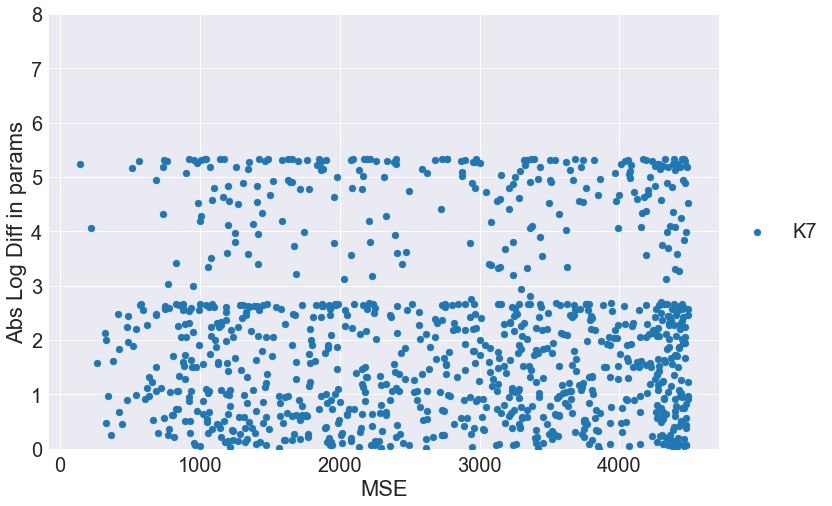

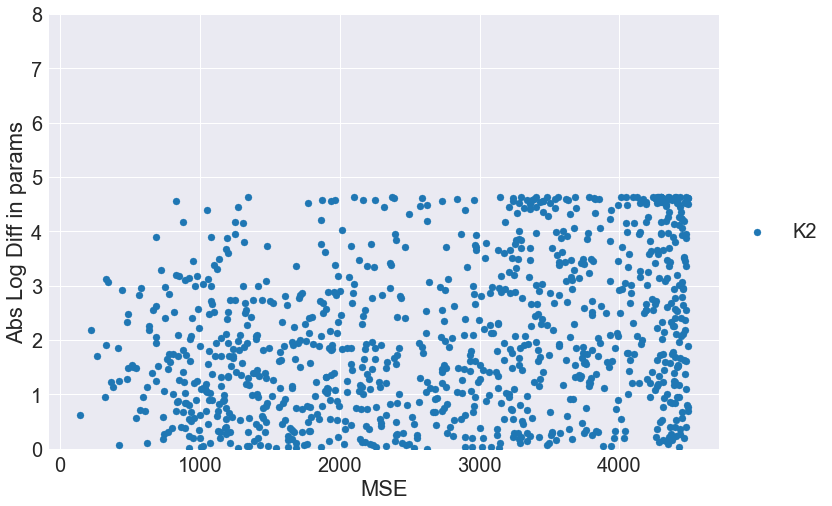

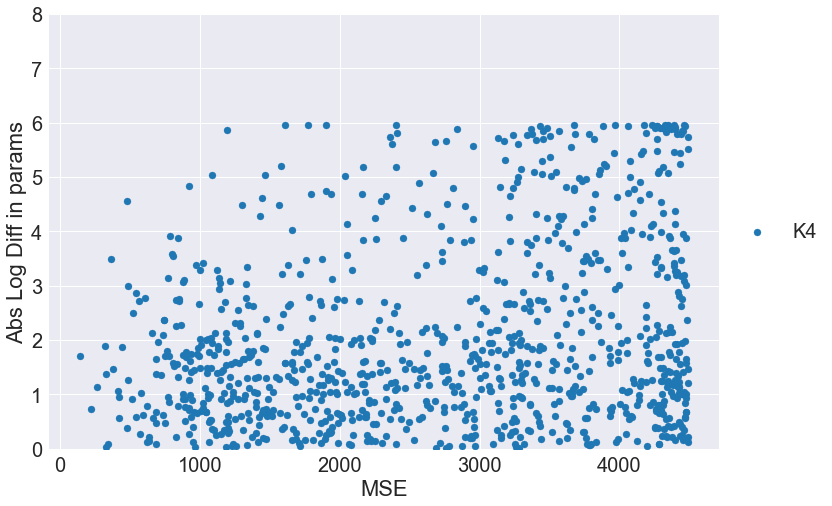

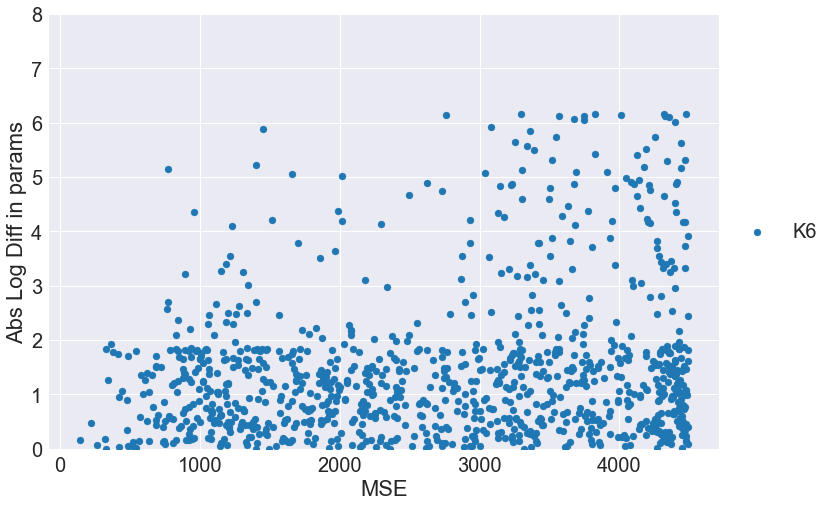

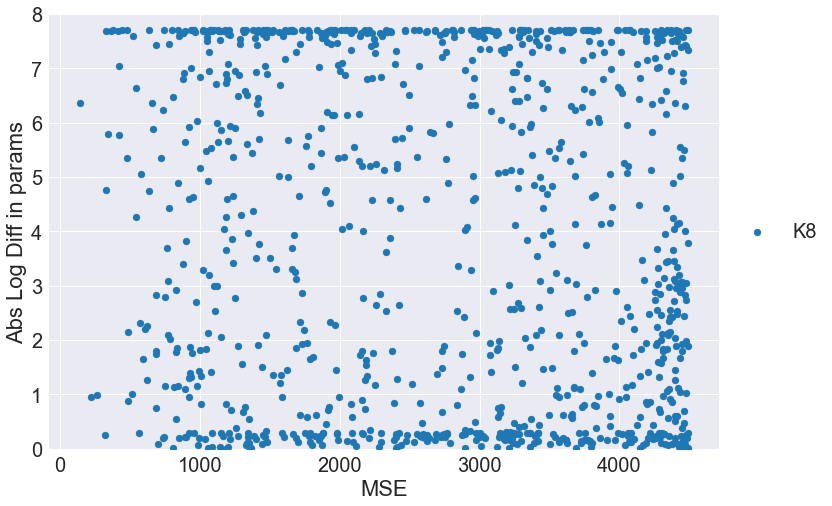

In [152]:
sns.set_palette("tab10")

individ_params = []
for param_set in _top_params:
    _d = np.zeros(len(synth_params))
    for i, (x, y) in enumerate(zip(param_set, synth_params)):
        _d[i] += abs(np.log10(x/y))
    individ_params.append(_d)
individ_params = np.asarray(individ_params).T
# _top_mses = []
# _top_params = []
# for idx in idx_top: 
#     _top_mses.append(mse[idx][gen])
#     _top_params.append(new_params.T[idx])
    
for i, params in enumerate(individ_params):
    plt.scatter(_top_mses, params, label=labelnames[i])
    plt.ylim(0,8)
    plt.xlabel('MSE')
    plt.ylabel('Abs Log Diff in params')
    plt.legend(bbox_to_anchor=[1, 0.5], loc='center left')
    plt.show()

# Clustering

In [9]:
import scipy.cluster.hierarchy as hac
from scipy.spatial.distance import pdist

In [22]:
df_params_raw = pd.DataFrame(top_params)
df_params = pd.DataFrame(top_params).apply(np.log10)
df_params.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-3.892630,-0.300456,-3.139591,1.401555,2.750071,1.057557,1.692252,0.967971,3.353323,-0.129763,1.976483,-1.496104,2.632087,3.946914,2.139690,0.877577,2.590735,2.419833
1,-3.271296,-1.032919,-2.737937,1.959020,2.731996,-1.471031,1.977536,1.878976,2.493906,-1.812946,0.400717,2.434236,0.493169,0.971738,-0.389233,2.783184,2.087830,-3.999263
2,-3.458159,0.311196,-2.638597,0.046055,3.795354,-0.320889,0.813572,1.346807,3.921956,2.017096,-3.984441,2.443983,0.188076,1.337684,0.637444,1.963426,2.169619,3.701340
3,-2.528873,-1.916779,-3.629274,2.493673,1.305703,-0.959725,2.112952,2.037336,3.821796,-3.998273,-0.123758,1.618724,1.063368,-3.996487,2.946211,1.359617,3.056356,3.871450
4,-3.063163,1.449168,-1.214736,3.993041,3.098501,-0.213282,3.620455,-0.103360,2.869682,-2.440615,0.353395,1.244205,-0.212543,1.045283,-3.213204,0.391766,2.886603,1.626236


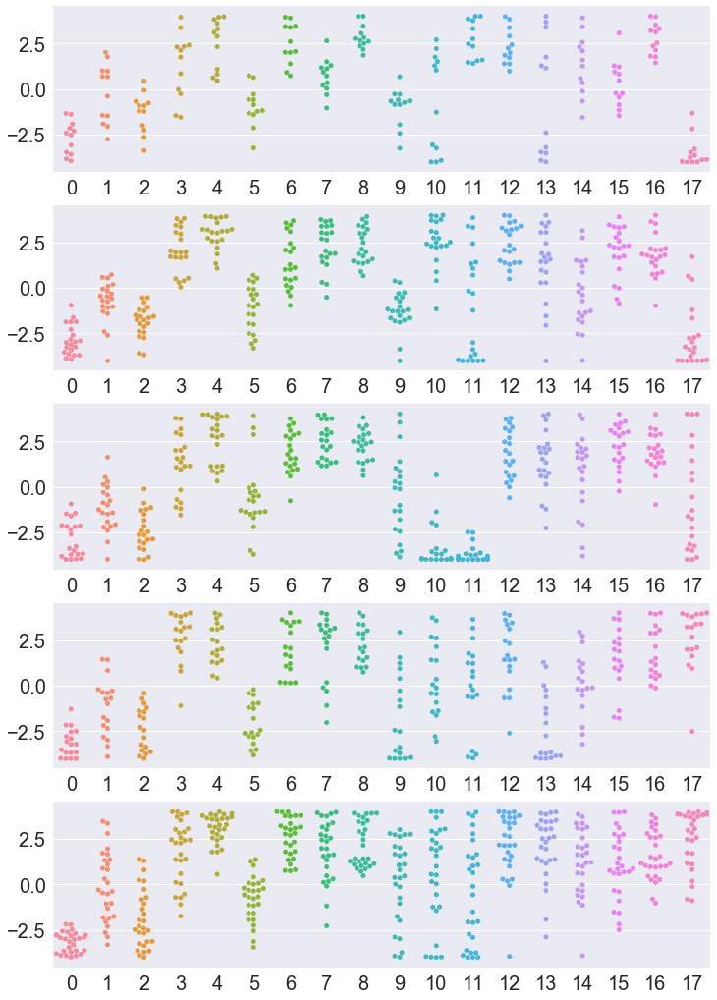

In [26]:
clust_num = 5

pairwise = pdist(df_params, metric='euclidean')
Z = hac.linkage(df_params, method='ward')
cluster = hac.fcluster(Z,t=clust_num,criterion='maxclust')
c, coph_dists = hac.cophenet(Z,pairwise)

sns.set(font_scale = 2)
plt.rcParams['figure.figsize'] = [12.0, 18.0]
fig, axs = plt.subplots(clust_num,1)
# plt.plot(data=df_params.loc[cluster==1,:].values, time = tps, err_style="unit_traces",ax=axs[0])

for i in range(clust_num):
    sns.swarmplot(data = df_params.loc[cluster==i+1,:].values,ax=axs[i])

C:\Users\sksuzuki\Anaconda3\lib\site-packages\scipy\integrate\odepack.py:218: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


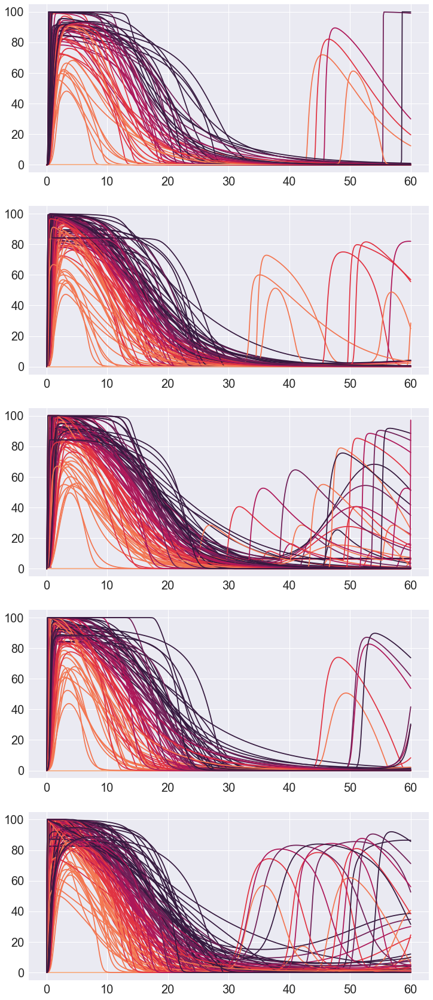

In [27]:
fig, axs = plt.subplots(clust_num, 1, figsize=(12,30))
# plt.plot(data=df_params.loc[cluster==1,:].values, time = tps, err_style="unit_traces",ax=axs[0])

for i in range(clust_num):
    for params in df_params_raw.loc[cluster==i+1,:].values:
        for idx, signal in enumerate(s):
            data = odeint(b0_a3_1D, initals, time, args=(params_constants[:-1]+[signal], params))
            active = data[:,2]
            axs[i].plot(time, active, label=str(signal)+' WT active', color=color_palette[idx])
#     sns.swarmplot(data = df_params.loc[cluster==i+1,:].values,ax=axs[i])

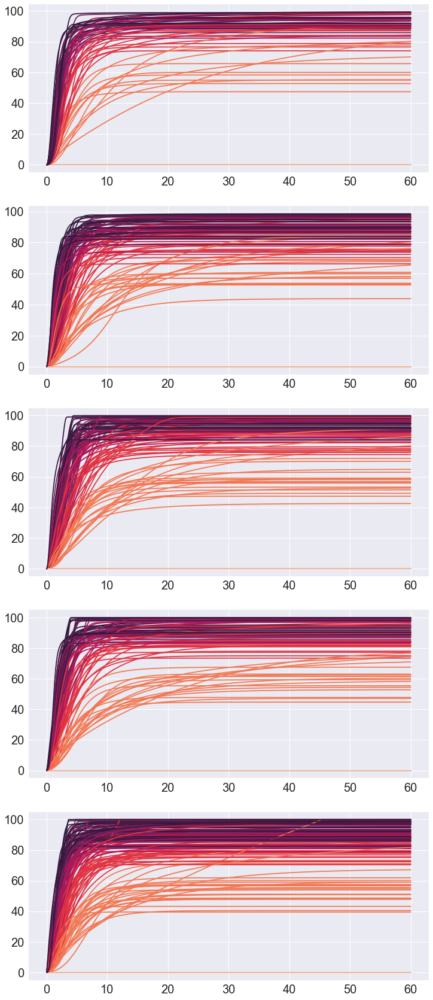

In [28]:
fig, axs = plt.subplots(clust_num, 1, figsize=(12,30))
# plt.plot(data=df_params.loc[cluster==1,:].values, time = tps, err_style="unit_traces",ax=axs[0])

for i in range(clust_num):
    for params in df_params_raw.loc[cluster==i+1,:].values:
        for idx, signal in enumerate(s):
#             data = odeint(b0_a3_1D, initals, time, args=(params_constants[:-1]+[signal], params))
            data = simulate_t100a_experiment_a3_1D(initals, params_constants[:-1]+[signal], params, time)
            active = data[:,2]
            axs[i].plot(time, active, label=str(signal)+' T100A active', color=color_palette[idx])
#     sns.swarmplot(data = df_params.loc[cluster==i+1,:].values,ax=axs[i])